# Single Channel Spectrograms

In [1]:
import xarray as xr
from scipy import signal
import numpy as np
import pandas as pd
import ODLintake
import matplotlib.pyplot as plt
import hvplot.xarray
from dask.distributed import Client

plt.rcParams.update({
    'text.usetex':True,
    'font.family':'serif',
    'font.size':18
})

import seaborn as sns
# set the theme
sns.set_palette('inferno', 4)

import DAStools.tools as das
import DAStools.dasfuncs as dasfuncs

%load_ext autoreload
%autoreload 2

In [2]:
client = Client()
client

/home/jhrag/anaconda3/envs/ooi_dev/lib/python3.10/site-packages/distributed/node.py:183: UserWarning: Port 8787 is already in use.
Perhaps you already have a cluster running?
Hosting the HTTP server on port 34933 instead
  warnings.warn(


Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: http://127.0.0.1:34933/status,
Dashboard: http://127.0.0.1:34933/status,Workers: 12
Total threads: 120,Total memory: 448.74 GiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:38889,Workers: 12
Dashboard: http://127.0.0.1:34933/status,Total threads: 120
Started: Just now,Total memory: 448.74 GiB
Comm: tcp://127.0.0.1:40453,Total threads: 10
Dashboard: http://127.0.0.1:34975/status,Memory: 37.40 GiB
Nanny: tcp://127.0.0.1:37343,


In [3]:
ds = ODLintake.open_ooi_DAS_SouthTx()

In [26]:
start = pd.Timestamp(float(ds['RawDataTime'][0].values), unit='us')
end = pd.Timestamp(float(ds['RawDataTime'][-1].values), unit='us')

print(start, '-', end)

2021-11-01 23:11:14.834000 - 2021-11-04 05:35:14.829000


In [25]:
pd.Timestamp(start, unit='us')

Timestamp('2021-11-01 23:11:14.834000')

In [17]:
pd.Timestamp('2000-01-01') + pd.Timedelta(hours=int(start))

OverflowError: int too big to convert

## No Filtering

In [10]:
x_30000 = ds.isel({'distance':30000})['RawData'].values

In [12]:
x_30000.shape

(39168000,)

In [14]:
f,t,Sxx = signal.spectrogram(x_30000, fs=200, nperseg=1024)

Text(0.5, 1.0, 'Spectrogram without any filtering, channel 30000')

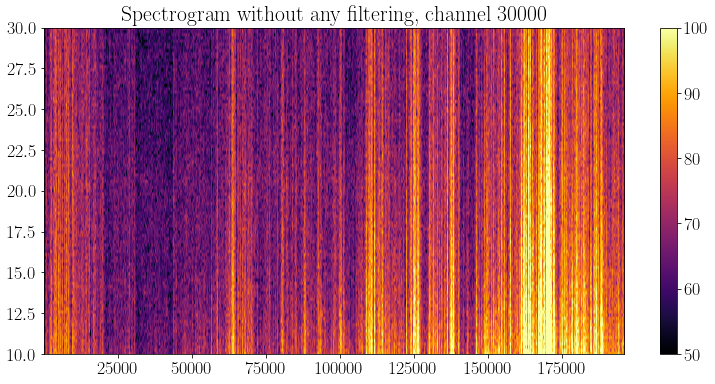

In [36]:
fig = plt.figure(figsize=(13,6))
plt.imshow(20*np.log10(Sxx[:,::10]), aspect='auto', extent=(t[0], t[-1], f[-1], f[0]), cmap='inferno', vmax=100, vmin=50)
plt.ylim([10,30])
plt.colorbar()
plt.title('Spectrogram without any filtering, channel 30000')

## Look at fk-filtered spectrogram (first attempt)

In [42]:
da_slice = ds.isel({'distance':slice(30000-1500, 30000+1500)})['RawData'].chunk({'distance':3000})

In [44]:
da_fk = das.fk_filt(da_slice, 1, 200, 1, 2.0419046878814697, 1400, 1600)

In [49]:
da_fk_single_channel = da_fk.sel({'distance':1500}).compute()

In [52]:
np.real(da_fk_single_channel).to_netcdf('/datadrive/DAS/30000_single_channel_fk_filtered_real.nc')
np.imag(da_fk_single_channel).to_netcdf('/datadrive/DAS/30000_single_channel_fk_filtered_imag.nc')

/tmp/ipykernel_1712/2211552780.py:1: SerializationWarning: saving variable RawData with floating point data as an integer dtype without any _FillValue to use for NaNs
  np.real(da_fk_single_channel).to_netcdf('/datadrive/DAS/30000_single_channel_fk_filtered_real.nc')
/tmp/ipykernel_1712/2211552780.py:2: SerializationWarning: saving variable RawData with floating point data as an integer dtype without any _FillValue to use for NaNs
  np.imag(da_fk_single_channel).to_netcdf('/datadrive/DAS/30000_single_channel_fk_filtered_imag.nc')


In [55]:
f,t,Sxx_fk = signal.spectrogram(np.real(da_fk_single_channel).values, fs=200, nperseg=1024)

In [65]:
Sxx_fk.shape

(513, 43714)

In [66]:
Sxx_fk_x = xr.DataArray(Sxx_fk, dims=['frequency', 'time'], coords={'frequency':f, 'time':t}, name='spectrogram fk filtered')

In [68]:
(10*np.log10(Sxx_fk_x)).hvplot.image(x='time', rasterize=True)

:DynamicMap   []
   :Image   [time,frequency]   (spectrogram fk filtered)

(26750.0, 27000.0)

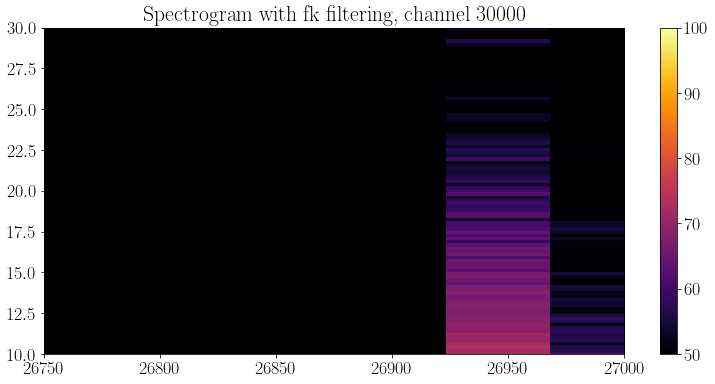

In [60]:
fig = plt.figure(figsize=(13,6))
plt.imshow(20*np.log10(Sxx_fk[:,::10]), aspect='auto', extent=(t[0], t[-1], f[-1], f[0]), cmap='inferno', vmax=100, vmin=50)
plt.ylim([10,30])
plt.colorbar()
plt.title('Spectrogram with fk filtering, channel 30000')
plt.xlim([26750, 27000])

## Explore fk filtering

In [ ]:
ds.isel({'distance':slice(30000, 33000, 4)})['RawData']

<xarray.DataArray 'RawData' (distance: 750, time: 39168000)>
dask.array<getitem, shape=(750, 39168000), dtype=int32, chunksize=(750, 3000), chunktype=numpy.ndarray>
Dimensions without coordinates: distance, time

## Explore Beamforming

#### save small slice to netcdf

In [4]:
da_slice = ds.isel({'distance':slice(30000,30100)})['RawData']

In [8]:
da_slice.to_netcdf('/datadrive/DAS/slices/30000_30100.nc')

### Try Beamformimg

In [9]:
fn = '/datadrive/DAS/slices/30000_30100.nc'
da = xr.load_dataarray(fn)

In [10]:
bf = dasfuncs.beamf(da.values, 2.0419046878814697, np.array([20]), 200, 15, 25)

IndexError: index 2937600 is out of bounds for axis 0 with size 1

In [ ]:
bf